<b>PROYECTO INDIVIDUAL Nº2</b>
# <b>"Accidentes Aereos"</b>

## Autor
* Carlos Eduardo Peña
* Carrera Data Science, Cohorte 15
* e-mail: carepe@gmail.com
* Repositorio del proyecto en Github: https://github.com/carepena/accidentes_aereos

### Objetivo Principal:
Realizar un analizis de la informacion disponible relacionada con los accidentes aereos sucedidos desde inicios del siglo XX, con base en información obtenida del dataset "AccidentesAviones.csv".

### Objetivos Secundarios:
+ Realizar un adecuado proceso de carga, manejo y optimizacion de datos (ETL) para su postertior analisis y uso
 
+ Realizar la respectiva exploración y análisis de datos con el objeto de comprender sus características, patrones, tendencias y relaciones; utilizando para ello metodos estadisticos y visualizaciones.

# ETL basico

Inicialmente cargamos las  librerias que necesitamos para la realizacion de todo el proceso

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns
import warnings
import datetime
from ydata_profiling import ProfileReport
warnings.filterwarnings("ignore")

Cargamos los datos desde el archivo 'AccidentesAviones.csv' a un Dataframe

In [2]:
df_acidentes_aviones = pd.read_csv('_src\data\AccidentesAviones.csv', encoding='UTF-8')

Miramos el contenido del Dataframe para su conocimiento inicial y decisiones de mejoras

In [3]:
df_acidentes_aviones

,Unnamed: 0,fecha,HORA declarada,Ruta,OperadOR,flight_no,route,ac_type,registration,cn_ln,all_aboard,PASAJEROS A BORDO,crew_aboard,cantidad de fallecidos,passenger_fatalities,crew_fatalities,ground,summary
0,0,"September 17, 1908",1718,"Fort Myer, Virginia",Military - U.S. Army,?,Demonstration,Wright Flyer III,?,1,2,1,1,1,1,0,0,"During a demonstration flight, a U.S. Army fly..."
1,1,"September 07, 1909",?,"Juvisy-sur-Orge, France",?,?,Air show,Wright Byplane,SC1,?,1,0,1,1,0,0,0,Eugene Lefebvre was the first pilot to ever be...
2,2,"July 12, 1912",0630,"Atlantic City, New Jersey",Military - U.S. Navy,?,Test flight,Dirigible,?,?,5,0,5,5,0,5,0,First U.S. dirigible Akron exploded just offsh...
3,3,"August 06, 1913",?,"Victoria, British Columbia, Canada",Private,?,?,Curtiss seaplane,?,?,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
4,4,"September 09, 1913",1830,Over the North Sea,Military - German Navy,?,?,Zeppelin L-1 (airship),?,?,20,?,?,14,?,?,0,The airship flew into a thunderstorm and encou...
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
5003,5003,"March 28, 2021",1835,"Near Butte, Alaska",Soloy Helicopters,?,Sightseeing Charter,Eurocopter AS350B3 Ecureuil,N351SH,4598,6,5,1,5,4,1,0,The sightseeing helicopter crashed after missi...
5004,5004,"May 21, 2021",1800,"Near Kaduna, Nigeria",Military - Nigerian Air Force,?,?,Beechcraft B300 King Air 350i,NAF203,FL-891,11,7,4,11,7,4,0,"While on final approach, in poor weather condi..."
5005,5005,"June 10, 2021",0800,"Near Pyin Oo Lwin, Myanmar",Military - Myanmar Air Force,?,Naypyidaw - Anisakan,Beechcraft 1900D,4610,E-325,14,12,2,12,11,1,0,The plane was carrying military personnel and ...
5006,5006,"July 04, 2021",11:30,"Patikul, Sulu, Philippines",Military - Philippine Air Force,?,Cagayan de Oro-Lumbia - Jolo,Lockheed C-130H Hercules,5125,5125,96,88,8,50,?,?,3,"While attempting to land at Jolo Airport, the ..."


Eliminamos la columna 'Unnamed:0' porque contiene los mismos datos da la columna de indexacion

In [4]:
df_acidentes_aviones.drop(['Unnamed: 0'], axis=1, inplace=True)

Cambio los nombres de las columnas por nombres con un significado

In [5]:
df_acidentes_aviones.rename(columns={'fecha': 'event_date'}, inplace=True)
df_acidentes_aviones.rename(columns={'HORA declarada': 'event_hour'}, inplace=True)
df_acidentes_aviones.rename(columns={'Ruta': 'event_place'}, inplace=True)
df_acidentes_aviones.rename(columns={'OperadOR': 'operator'}, inplace=True)
df_acidentes_aviones.rename(columns={'ac_type': 'aircraft_type'}, inplace=True)
df_acidentes_aviones.rename(columns={'PASAJEROS A BORDO': 'passengers_aboard'}, inplace=True)
df_acidentes_aviones.rename(columns={'cantidad de fallecidos': 'total_fatalities'}, inplace=True)
df_acidentes_aviones.rename(columns={'ground': 'fatalities_on_ground'}, inplace=True)


Reviso la cantidad de datos con valor '?' en cada columna

In [6]:
#.applymap() para aplicar la función a cada elemento del df
#lambda para verificar si un elemento es igual a '?'
count_colum =(df_acidentes_aviones.applymap(lambda x :x == '?')).sum()

#Muestro conteos por columna
for columna, conteo in count_colum.items():
    print (f'En {columna}, el caracter ? se repite : {conteo}')

En event_date, el caracter ? se repite : 0
En event_hour, el caracter ? se repite : 1504
En event_place, el caracter ? se repite : 5
En operator, el caracter ? se repite : 10
En flight_no, el caracter ? se repite : 3682
En route, el caracter ? se repite : 762
En aircraft_type, el caracter ? se repite : 13
En registration, el caracter ? se repite : 272
En cn_ln, el caracter ? se repite : 667
En all_aboard, el caracter ? se repite : 17
En passengers_aboard, el caracter ? se repite : 221
En crew_aboard, el caracter ? se repite : 219
En total_fatalities, el caracter ? se repite : 8
En passenger_fatalities, el caracter ? se repite : 235
En crew_fatalities, el caracter ? se repite : 235
En fatalities_on_ground, el caracter ? se repite : 44
En summary, el caracter ? se repite : 59


Reemplazamos los valores '?' en cada columna por un valor significativo para cada caso

In [7]:
df_acidentes_aviones["event_hour"] = df_acidentes_aviones["event_hour"].replace("?", pd.NaT)
df_acidentes_aviones["event_place"] = df_acidentes_aviones["event_place"].replace("?", pd.NA)
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("?", pd.NA)
df_acidentes_aviones["flight_no"] = df_acidentes_aviones["flight_no"].replace("?", pd.NA)
df_acidentes_aviones["route"] = df_acidentes_aviones["route"].replace("?", pd.NA)
df_acidentes_aviones["aircraft_type"] = df_acidentes_aviones["aircraft_type"].replace("?", pd.NA)
df_acidentes_aviones["registration"] = df_acidentes_aviones["registration"].replace("?", pd.NA)
df_acidentes_aviones["cn_ln"] = df_acidentes_aviones["cn_ln"].replace("?", pd.NA)
df_acidentes_aviones["all_aboard"] = df_acidentes_aviones["all_aboard"].replace("?", np.nan)
df_acidentes_aviones["passengers_aboard"] = df_acidentes_aviones["passengers_aboard"].replace("?", np.nan)
df_acidentes_aviones["crew_aboard"] = df_acidentes_aviones["crew_aboard"].replace("?", np.nan)
df_acidentes_aviones["total_fatalities"] = df_acidentes_aviones["total_fatalities"].replace("?", np.nan)
df_acidentes_aviones["passenger_fatalities"] = df_acidentes_aviones["passenger_fatalities"].replace("?", np.nan)
df_acidentes_aviones["crew_fatalities"] = df_acidentes_aviones["crew_fatalities"].replace("?", np.nan)
df_acidentes_aviones["fatalities_on_ground"] = df_acidentes_aviones["fatalities_on_ground"].replace("?", np.nan)
df_acidentes_aviones["summary"] = df_acidentes_aviones["summary"].replace("?", pd.NA)

# EDA Analisis exploratorio de datos

## Diccionarios de datos
Ante la necesidad de comprender mejor la información, del análisis intuitivo con origen en el nombre de las columnas y los datos que ellas contienen, complementado con información específica de fuentes de datos públicas relacionadas con la Organización de Aviación Civil Internacional (OACI), quien nos requiriera el presente trabajo.
Algunas de las fuentes consultadas fueron:
* https://data.ntsb.gov/avdata/FileDirectory/DownloadFile?fileID=C%3A%5Cavdata%5Ccodman.pdf
* https://data.ntsb.gov/avdata/FileDirectory/DownloadFile?fileID=C%3A%5Cavdata%5Ceadmspub.pdf
* https://data.ntsb.gov/avdata/FileDirectory/DownloadFile?fileID=C%3A%5Cavdata%5Ceadmspub_legacy.pdf

### Diccionario de acuerdo al dataframe ingestado con los datos de "AccidentesAviones.csv"
| *Columna* | *Descripción* |
| --- | --- |
| event_date | Fecha del accidente (formato Mes Dia, Año) |
| event_hour | Hora local, en 24 hr (formato hh |mm) |
| event_place | Lugar del accidente |
| operator | Línea aérea u operador de la aeronave |
| flight_no | Número de vuelo asignado por el operador de la aeronave |
| route | Ruta completa o parcial volada antes del accidente |
| aircraft_type | Tipo de aeronave |
| registration | Registro OACI de la aeronave |
| cn/In | Número de construcción o de serie / Número de línea o de fuselaje |
| all_aboard | Total de personas a bordo |
| passengers_aboard | Pasajeros a bordo |
| crew_aboard | Tripulación a bordo |
| total_fatalities | Total de víctimas mortales |
| passenger_fatalities | Pasajeros fallecidos |
| crew_fatalities | Tripulantes fallecidos |
| fatalities_on_ground | Total de muertos en tierra |
| summary | Resumen de los hechos |

Entendiendo la informacion presentada, existen dos tipos de operadores que considero fundamental hacer su separacion para los subsiguientes analizis: Operadores Civiles y Operadores Militares. Esta diferenciacion la considero de fundamental importancia, primero porque las causas de accidentes aereos pueden ser completamente diferentes en cada categoria por la naturaleza propia del ejercicio de sus misiones corporativas; y segundo porque la ingerencia que se pueda tener en tomar cualquier tipo de decision o accion, puede ser minima o totalmente nula en los operadores militares por sus propias caracteristicas intrinsicas

Voy a crear una nueva columna con el tipo de operador para diferenciar si el respectivo vuelo corresponde a un ente civil o militar

Primero normalizo unos registros donde la palabra 'Military' se encuentra mal escrita

In [8]:
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("Mililtary - Royal Canadian Air Force", 'Military - Royal Canadian Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("Militiary - US Air Force", 'Military - US Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("Miltary - U.S. Airforce", 'Military - US Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("Miliitary - SATENA", 'Military - SATENA')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("Mililtary - Soviet Air Force", 'Military - Soviet Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("U. S. Air Force", 'Military - US Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("u.s. Air Force", 'Military - US Air Force')
df_acidentes_aviones["operator"] = df_acidentes_aviones["operator"].replace("U.S. Government (leased)", 'Military - US Air Force')

Creo la nueva columna con las caracteriticas mencionadas

In [9]:
def TipoOperador(operator):
    if pd.isna(operator): 
        retorno=None
    elif 'Military' in operator:
        retorno = 'Military'
    else:
        retorno = 'Civil'
    return retorno

df_acidentes_aviones['operator_type'] = df_acidentes_aviones['operator'].apply(TipoOperador)


Creo un nuevo Dataframe solo con la informacion correspondiente a Operadores Civiles y borro la columna de operator_type pues ya no la necesito.
Este va a ser mi Dataframe de analisis de aqui en adelante

In [10]:
df_acidentes_aviones_civil = df_acidentes_aviones[df_acidentes_aviones['operator_type'] == 'Civil']
df_acidentes_aviones_civil.drop('operator_type', axis=1, inplace=True)

Observo el resultado del Dataframe final

In [11]:
df_acidentes_aviones_civil

,event_date,event_hour,event_place,operator,flight_no,route,aircraft_type,registration,cn_ln,all_aboard,passengers_aboard,crew_aboard,total_fatalities,passenger_fatalities,crew_fatalities,fatalities_on_ground,summary
3,"August 06, 1913",NaT,"Victoria, British Columbia, Canada",Private,NaN,<NA>,Curtiss seaplane,<NA>,NaN,1,0,1,1,0,1,0,The first fatal airplane accident in Canada oc...
23,"December 16, 1918",NaT,"Elizabeth, New Jersey",US Aerial Mail Service,NaN,<NA>,De Havilland DH-4,97,NaN,1,0,1,1,0,1,0,Carl Smith was killed when his mail plane feet...
24,"May 25, 1919",NaT,"Cleveland, Ohio",US Aerial Mail Service,NaN,<NA>,De Havilland DH-4,61,NaN,1,0,1,1,0,1,0,Caught fire in midair. The pilot leaped from t...
25,"July 19, 1919",NaT,"Dix Run, Pennsylvania",US Aerial Mail Service,NaN,<NA>,De Havilland DH-4,82,NaN,1,0,1,1,0,1,0,The mail plane crashed under unknown circumsta...
26,"July 21, 1919",1655,"Chicago, Illinois",Wingfoot Air Express Goodyear Tire,NaN,Shuttle,FD Type Dirigible,<NA>,NaN,NaN,NaN,NaN,3,2,1,10,"The dirigible, cruising at 1,200 ft. caught fi..."
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4999,"August 22, 2020",0840,"Juba, South Sudan",South West Aviaiton,<NA>,Juba - Wau,Antonov 26B,EX-126,11508,8,5,3,7,4,3,0,The cargo plane lost height shortly after depa...
5001,"January 09, 2021",1440,"Near Jakarta, Indonesia",Sriwijaya Air,SJ182,Jakarta - Pontianak,Boeing 737-524,PK-CLC,27323/2616,62,56,6,62,56,6,0,Sriwijaya Air flight 182 was climbing through ...
5002,"March 02, 2021",1705,"Pieri, Sudan",South Sudan Supreme Airlines,<NA>,Pieri - Yuai,Let L-410UVP-E,HK-4274,902525,10,8,2,10,8,2,0,One of the engines on the aircraft failed 10 m...
5003,"March 28, 2021",1835,"Near Butte, Alaska",Soloy Helicopters,<NA>,Sightseeing Charter,Eurocopter AS350B3 Ecureuil,N351SH,4598,6,5,1,5,4,1,0,The sightseeing helicopter crashed after missi...


Verificamos la presencia de datos duplicados

In [12]:
df_acidentes_aviones_civil.duplicated().sum()

0

No existen valores duplicados

Aplicamos la libreria 'profilingReport' de Pandas para realizar un analizis mas detallado de la informacion presentada

In [13]:
profile = ProfileReport(df_acidentes_aviones_civil, title='Pandas Profiling Report', html={'style':{'full_width':True}})
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

Observando el resultado anterior, podemos resaltar que el Dataframe total tiene solo un 7.9% de celdas faltantes lo que significa que que es una buena fuente de informacion para trabajar; Adicionalmente y entendiendo que el proposito final de este ejercicio es encontrar relaciones que puedan impactar en la disminucion de accidentes aereos, puedo inferir que el 'flight_no' (Numero del vuelo) y el 'cn_ln' (Numero de serie) no aportan informacion relvante para el objetivo final, por lo cual no las voy a tener en cuenta en adelante en los analizis que se realicen.
Con la anterior claridad, observo que tengo un porcentaje significativo de datos nunlos o vacios en las columnas 'event_hour' con un 30% y route con un 12% lo cual tengo que tener en cuenta en los analizis posteriores. Los valores inferiores al 5% no los tomo como relevantes. El mapa de calor de las correlaciones, mustra claramente que la informacion analizada tiene un alto grado de correlacion lo que nos indica que se pueden hacer cruces de informacion con la garantia de una buena correlacion. 

Aplicamos la funcion Seaborn Boxplot para la revision de Outliers

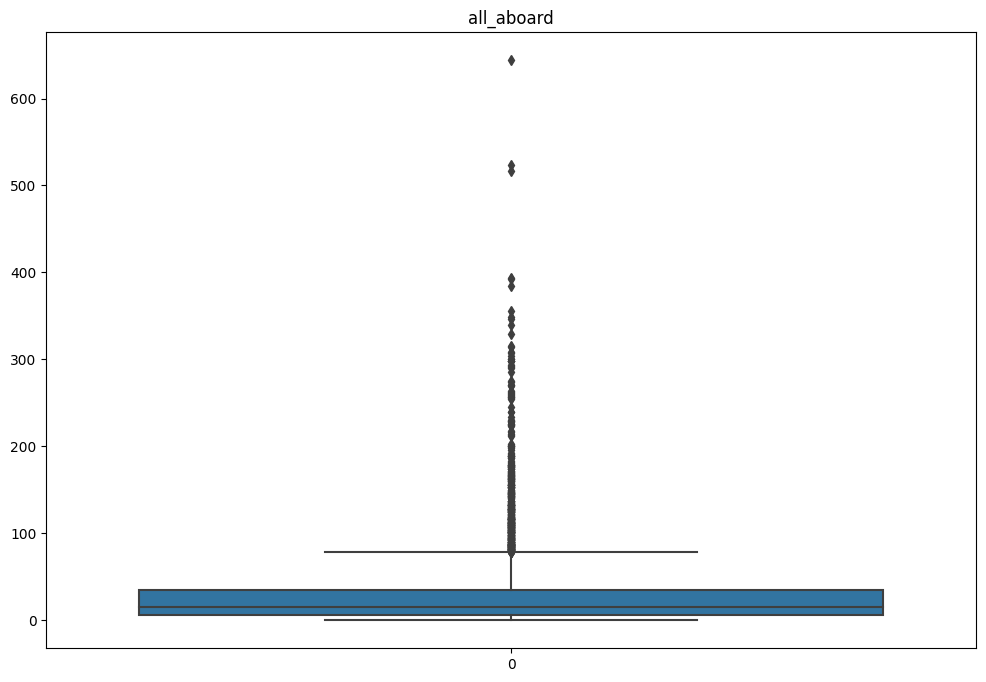

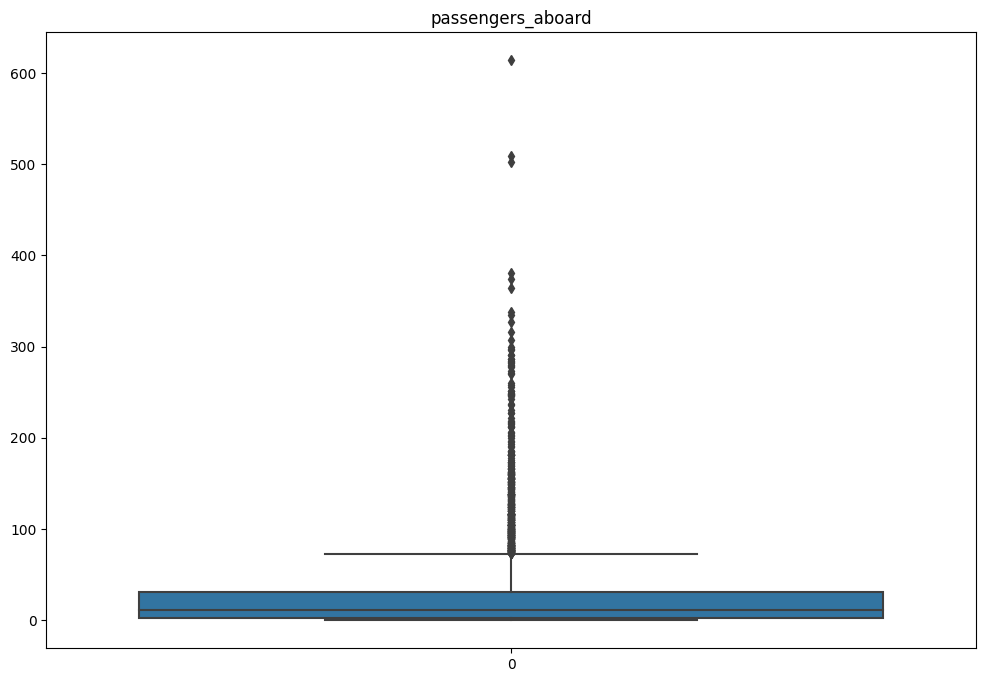

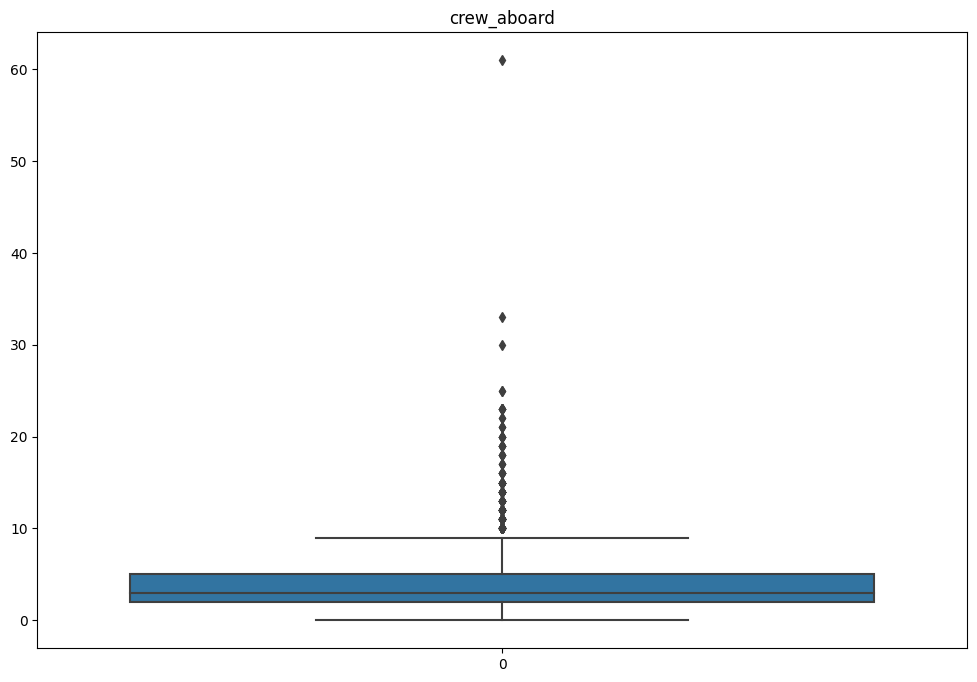

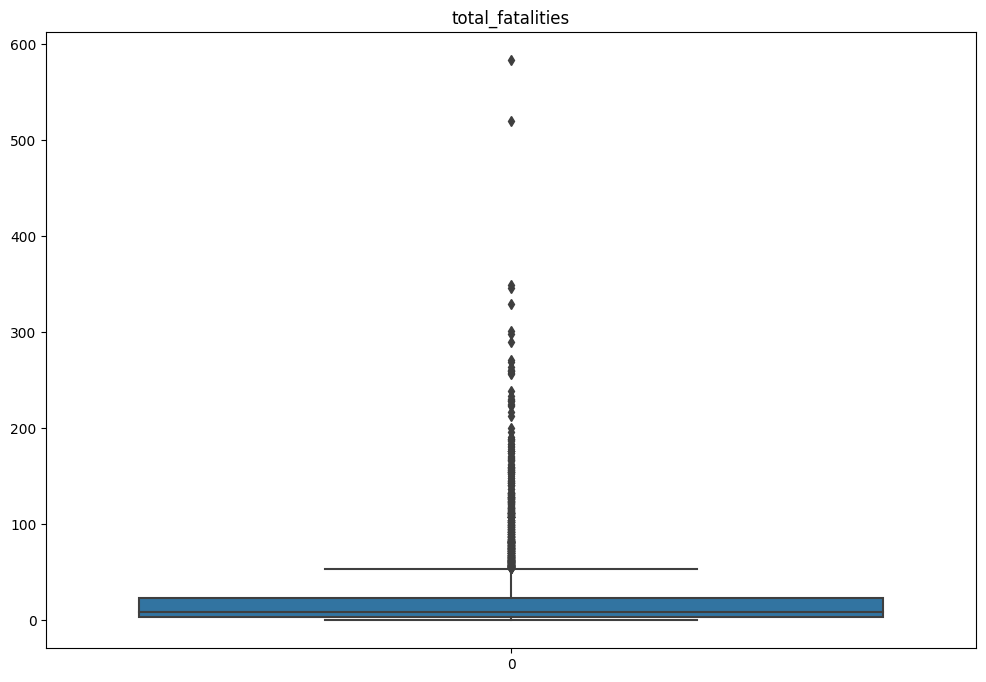

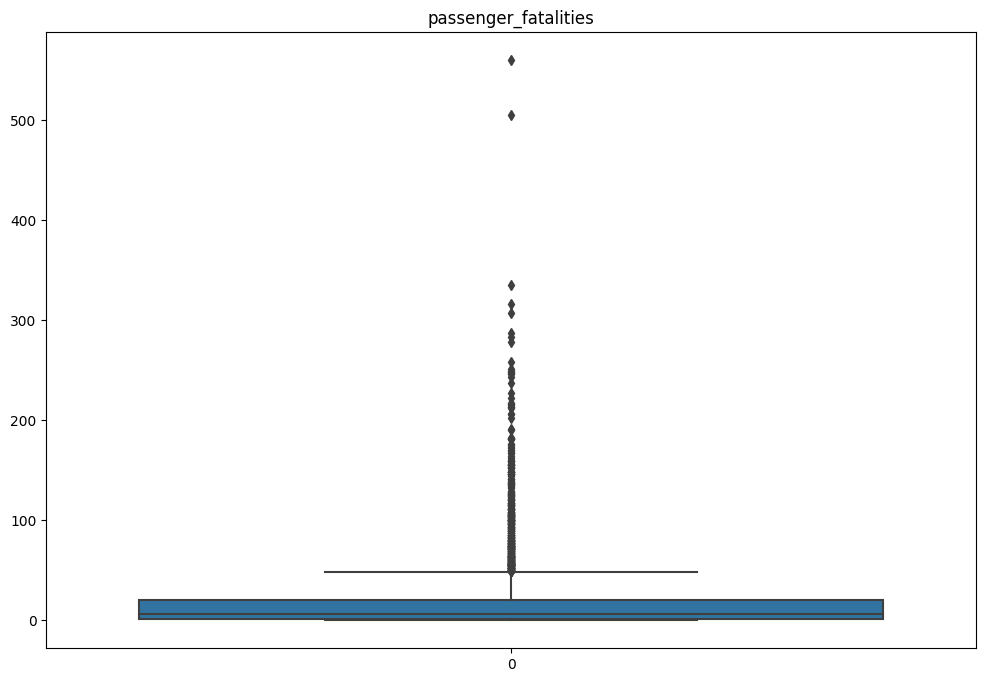

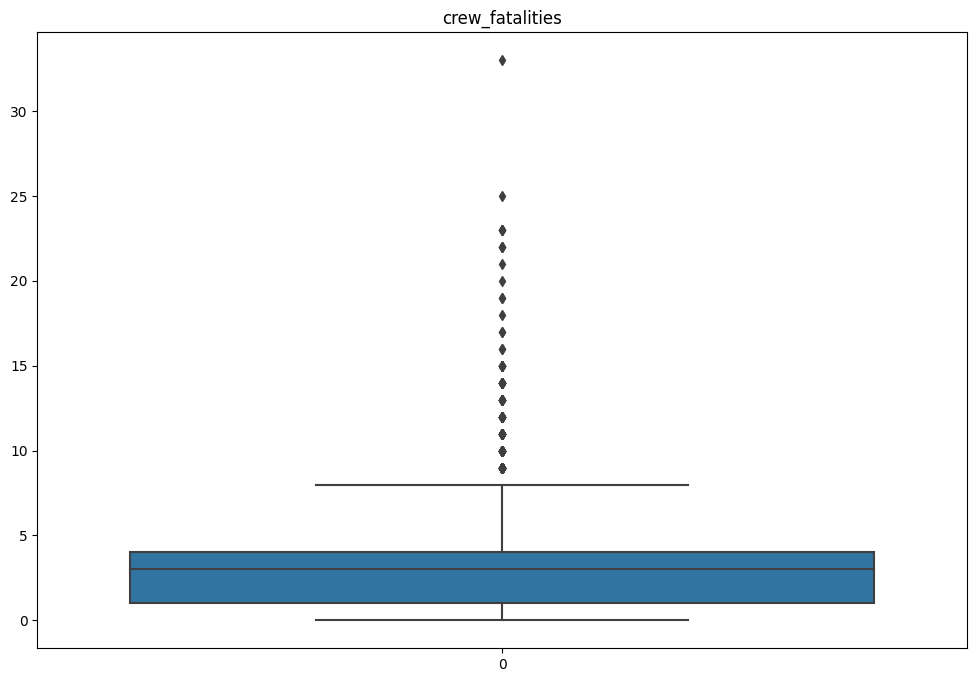

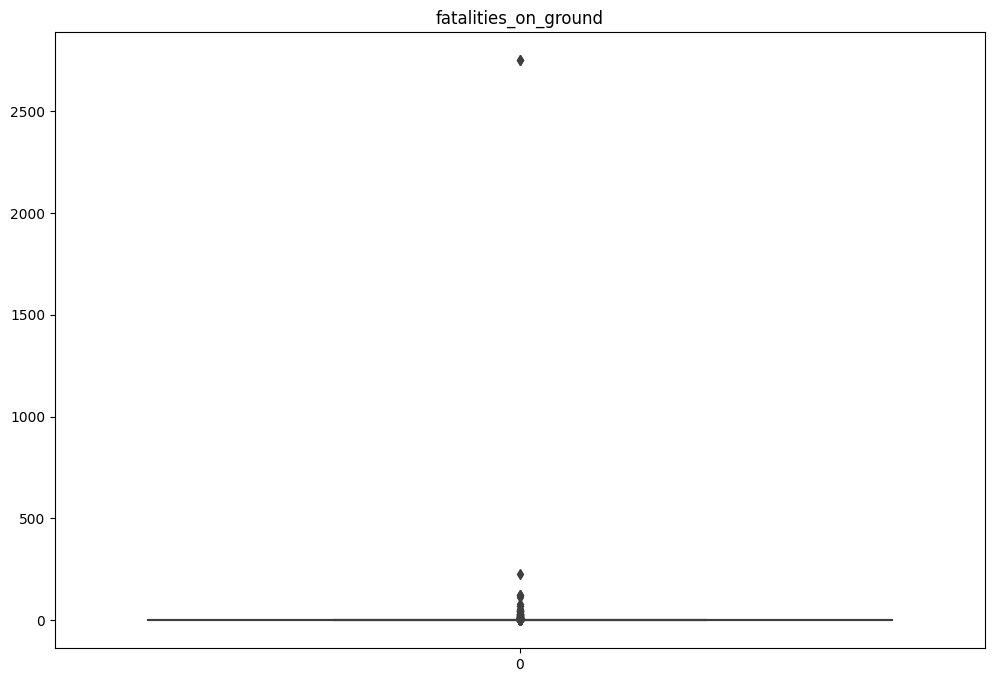

In [14]:
columnas = ['all_aboard', 'passengers_aboard', 'crew_aboard' , 'total_fatalities', 'passenger_fatalities', 'crew_fatalities', 'fatalities_on_ground']
df_acidentes_aviones_civil = df_acidentes_aviones_civil.reset_index()
for columna in columnas:
    plt.figure(figsize=(12,8))
    sns.boxplot(df_acidentes_aviones_civil[(df_acidentes_aviones_civil[columna].isna()==False)][columna])
    plt.title(columna)
    plt.show()

Del analisis de las anteriores 'cajas de bigotes' se puede apreciar que la mayor parte de los accidentes aereos han tenido lugar en aeronaves con hasta 50 pasageros aproximadamente. Adicxionalmente las graficas muestran una gran cantidad de 'Outliers' pero revisando la informacion en la tabla la realidad es que estos registros no son outliers sino informacion real de accidentes aereos y por ende se toman todos los registros como validos

Por ultimo grabo las dos tablas finales, la tabla con informacion de operadopres civiles y militares, y la tabla con informacion solo de operadores civiles; para su uso en el Dashboard  de analisis

In [15]:
df_acidentes_aviones.to_csv('df_acidentes_aviones.csv', index=False)
df_acidentes_aviones_civil.to_csv('df_acidentes_aviones_civil.csv', index=False)